# Image Colorization using Conditional Generative Adversarial Networks (GANs)

The purpose of this Jupyter Notebook is to train a Unet generator network in a Conditional GAN framework in order to colorize grayscale images. In this notebook the Conditional GAN network will be composed by an advanced Unet generator where the down-sampling part is composed by a ResNet18 backbone and the up-sampling part is done by using PixelShuffle layers, so we are going to implement our advanced solution. All the details about the dataset, models, training strategies and losses used in this implementation will ge biven along the notebook. 

In [1]:
#PACKAGES IMPORT

import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt                      
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.transforms import Compose, ToTensor
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader

from fastai.data.external import untar_data,URLs
from fastai.data.transforms import get_image_files

import PIL

#DEVICE SELECTION
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

##DATASET CREATION

For this task we decided to use the COCO SAMPLE dataset. This dataset is easy to retrieve by using FastAI facilities. After downloading it we split it into training and test set, we wrote the CustomDataset class and we define the training and test dataloaders. For this task our generator network has to colorize the images so, starting from a simple image of the dataset we convert it to the Lab color space, so the generatoro will have in input the L layer of every image (the L layer defines the intensity layer) and has to predict the ab layers (that defines the colors of the image). We provide this split already in the CustomDataset, so the train and test dataloaders can return Lab images in a fast and clear way. 

In [2]:
#COCO SAMPLE Dataset download
path = untar_data(URLs.COCO_SAMPLE) 
coco_path = str(path) + "/train_sample" 

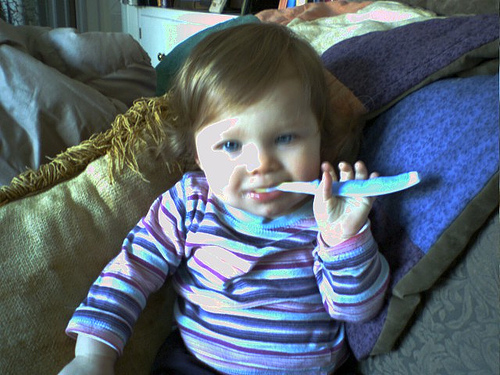

In [3]:
#try to open a single image in the dataset 
dataset = get_image_files(coco_path)   
img = PIL.Image.open(dataset[1])
img

In [4]:
#Retrieve some info
print("INFO DATASET:")
print("Dataset length: ", len(dataset))
print("Images dimensions: ", img.size)

INFO DATASET:
Dataset length:  21837
Images dimensions:  (500, 375)


In [5]:
#define the train and test dataset split 

paths = glob.glob(coco_path+"/*.jpg")                                # paths is a list with all the image files names of the COCO dataset
np.random.seed(123)                                                  # Seeding for reproducible results
paths_subset = np.random.choice(paths, 20000, replace=False)         # Randomly choosing 20,000 images (image file names) from the list
rand_idxs = np.random.permutation(20000)                             # Shuffling the indexes
train_idxs = rand_idxs[:19900]                                       # Using first 19900 images for training
test_idxs = rand_idxs[19900:]                                        # Using last 100 images for testing
train_paths = paths_subset[train_idxs]                               # Array with all the image files names for the training
test_paths = paths_subset[test_idxs]                                 # Array with all the image files names for the validation
print("Training set length: "+str(len(train_paths)))
print("Test set length: "+str(len(test_paths)))

Training set length: 19900
Test set length: 100


In [6]:
#CustomDataset class creation

#in our task we will consider images that have a SIZE x SIZE dimension. We define a simple constant for this SIZE value
SIZE= 256

class CustomDataset(Dataset):

    '''
    @param paths list of all the dataset images paths
    @param transform transformation that must be applyied to the dataset images
    @param training_mode simple parameter that indicates if this is a training or test set 
    '''
    def __init__(self, paths, transform, training_mode=True):
        self.paths = paths
        self.size = SIZE
        self.training_mode = training_mode

        if training_mode:
          self.transform = transform
        else:
          #simple resize to the SIZE x SIZE dimensions
          self.transform = Compose([
              transforms.Resize((SIZE,SIZE), Image.BICUBIC),
          ])

    '''
    @param index in the paths array of the images that must be returned
    @return the image split into the L and ab layers
    '''
    def __getitem__(self, index):
        #open the image as an RGB image and apply the correct transformations and transform to numpy array
        img = Image.open(self.paths[index]).convert("RGB")
        img = self.transform(img)
        img = np.array(img)

        #converting RGB to L*a*b color space used for the task and then to a tensor
        img_lab = rgb2lab(img).astype("float32")
        img_lab = transforms.ToTensor()(img_lab)

        #normalization of the L and ab layers values
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        
        #return the image split into the L and ab layers
        return {'L': L, 'ab': ab}
        
    '''
    @return the dataset length
    '''
    def __len__(self): 
      return len(self.paths)
 


In [7]:
#define the train and test datasets and the batch size, the batch size was define in order to fit into the CUDA memory
batch_size = 16

#we define this simple transformation for the training dataset
train_transform = transforms.Compose([
     transforms.Resize((SIZE,SIZE), Image.BICUBIC),
])

#define the train and test datasets and dataloaders
train_dataset =  CustomDataset(train_paths, train_transform, training_mode = True)
test_dataset =  CustomDataset(test_paths, transform = None, training_mode = False)

train_dataloader = DataLoader(train_dataset, batch_size, shuffle=True, num_workers=os.cpu_count())
test_dataloader = DataLoader(test_dataset, batch_size, shuffle=False, num_workers=os.cpu_count())

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(


In [8]:
#verify that all is correct 
print("Train dataloader next item:")
data = next(iter(train_dataloader))
Ls, abs = data['L'], data['ab']
print(Ls.shape, abs.shape)
print("Train dataloader and test dataloader dimensions:")
print(len(train_dataloader), len(test_dataloader))
print("L layer variable type:")
type(data['L'])

Train dataloader next item:
torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
Train dataloader and test dataloader dimensions:
1244 7
L layer variable type:


torch.Tensor

##GAN NETWORK MODELS DEFINITINON AND INITIALIZATION: UNET AND PATCH DISCRIMINATOR

In this section we define the models that compose our Conditional GAN: we define an Advanced Unet generator and a Patch discriminator.  This architecture is composed by a ResNet18 as backbone in the downsampling path and the upsampling path is realized by using PixelShuffle layers with ICNR weights ini-
tialization. This generator is built by using the FastAI facilities. The ResNet18 backbone is pre-trained in the ImageNet Dataset for a classification task, and we are going to use all its layers except the last two: GlobalAveragePooling and a Linear layer that are used for the ImageNet classification task. The PixelShuffle layers receive the tensors to be upsampled and the activations features from the intermediate layers of the down
sampling path. This network has to generate from the L layer of the image the ab layers. We defined also our Patch Discriminator that is defined as a 70 x 70 pixels patch discriminator that indicates for every 70 x 70 pixels patch in a given image if it is a true patch or if it is generated by the Unet. So the Patch Discriminator will receive a fake image (built by concatenating the L layer in input to the generator and the generated ab layers) or a true image. 

We also define a function for initiliazing the networks weights with uniform or xavier criterion. We will use the uniform criterion because the xavier criterion initialize the weights of the discriminator network in a way that makes it too strong after few epochs, so the generator training stalls.  

### Patch Discriminator

In [9]:
import torch
import torch.nn as nn

class ConvBNLeakyRelu(nn.Module):
  def __init__(self, in_ch, out_ch, kernel_size=(4,4), stride=(2,2), padding=(1,1)):
    super().__init__()
    self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size, stride, padding, bias=False)
    self.bn1 = nn.BatchNorm2d(out_ch, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    self.relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)

  def forward(self,inputs):
    x = self.conv1(inputs)
    x = self.bn1(x)
    x = self.relu(x)
    return x

class ConvLeakyRelu(nn.Module):
  def __init__(self, in_ch, out_ch):
    super().__init__()
    self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=(4,4), stride=(2,2), padding=(1,1))
    self.relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)

  def forward(self,inputs):
    x = self.conv1(inputs)
    x = self.relu(x)
    return x

class PatchDiscriminator(nn.Module):
  def __init__(self):
    super().__init__()
    self.model = nn.Sequential(
        ConvLeakyRelu(3,64),
        ConvBNLeakyRelu(64,128),
        ConvBNLeakyRelu(128,256),
        ConvBNLeakyRelu(256,512, stride=(1,1)),
        nn.Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    )

  def forward(self, inputs):
    return self.model(inputs)

### Unet with ResNet18 backbone

In [10]:
# pip install fastai==2.4
from fastai.vision.learner import create_body
from torchvision.models import resnet18
from fastai.vision.models.unet import DynamicUnet

In [11]:
def build_res_unet(n_input=1, n_output=2, size=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18(), pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G

build_res_unet()

DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05

### Weights initialization

In [12]:
#param: model that has to be initialized
#param: init, how to initialize the weights (xavier or norm)
def initialize_weights(model, init="normal"):
    classname = model.__class__.__name__
    if classname.find('Conv2d') != -1:
        if(init=="xavier"): 
          nn.init.xavier_uniform_(model.weight.data)
        if(init=="normal"):
          nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.2)
        nn.init.constant_(model.bias.data, 0)

In [13]:
""" MeterUtility:
    This class implements an utility meter usefull to compute the loss function
"""
class LossMeterUtility:

  def __init__(self):
    self.reset()

  def reset(self):
    self.count, self.avg, self.sum = [0.] * 3

  def update(self, values, count=1):
    self.count += count
    self.sum += count * values
    self.avg = self.sum / self.count

""" LossEvaluation
    This class implements all things needed to compute and save the loss 
    function over epochs
"""
class LossEvaluation:
  def __init__(self):
    self.loss_D_fake = LossMeterUtility()
    self.loss_D_real = LossMeterUtility()
    self.loss_D = LossMeterUtility()
    self.loss_G_GAN_PERC = LossMeterUtility()
    self.loss_G_GAN_CRIT = LossMeterUtility()
    self.loss_G_L1 = LossMeterUtility()
    self.loss_G = LossMeterUtility()

  def get_losses(self):
    return {'loss_D_fake': self.loss_D_fake,
            'loss_D_real': self.loss_D_real,
            'loss_D': self.loss_D,
            'loss_G_GAN_PERC': self.loss_G_GAN_PERC,
            'loss_G_GAN_CRIT': self.loss_G_GAN_CRIT,
            'loss_G_L1': self.loss_G_L1,
            'loss_G': self.loss_G}
  
  def update_losses(self, model, loss_dict, count):
    for loss_name, loss_meter in loss_dict.items():
      #get loss value from the model class and the given loss meter name
      loss = getattr(model, loss_name)
      #update loss meter
      loss_meter.update(loss.item(), count)

  def print_losses(self, loss_dict):
    for loss_name, loss_meter in loss_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

  def save_losses(self, loss_dict, epoch, path_losses):
    with open(path_losses, 'a') as file:
      file.write("---------------------------")
      file.write(f"Epoch: {epoch}\n")
      for loss_name, loss_meter in loss_dict.items():
        file.write(f"{loss_name}: {loss_meter.avg:.5f}\n")
  

""" VisualizationUtility
    This class implements the visualization of some images usefull to understand
    learning phase:
      - image input to unet
      - image generated by unet
      - true image
""" 
class VisualizationUtility:

  def __init__(self, model, data):
    self.model = model
    self.data = data

  def visualize_images(self, save=True):
    #switch to model evaluation of the generator and turn off grandients computation 
    self.model.generator.eval()
    with torch.no_grad():
      #setup input model from data images comes from dataloader
      self.model.setup_input(self.data)
      #compute forward step
      self.model.forward()
    #switch to model training of the generator  
    self.model.generator.train()
    #get predicted ab channels
    fake_ab = self.model.fake_color.detach()
    #get real ab channels
    real_ab = self.model.ab
    #get real L channel
    real_L = self.model.L
    #get converted fake images
    fake_images = self.convert_images(real_L, fake_ab)
    #get converted real images
    real_images = self.convert_images(real_L, real_ab)
    #plot images
    self.plot_figure(real_L, fake_images, real_images, save)

  def convert_images(self, L_ch, ab_ch):
    #normalize L, ab channels
    L_ch = (L_ch + 1.) * 50.
    ab_ch = ab_ch * 110.
    #concatenate L, ab channels 
    Lab_image = torch.cat([L_ch, ab_ch], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_images = []
    for image in Lab_image:
        #convert image from L*a*b to R*G*B
        img_rgb = lab2rgb(image)
        rgb_images.append(img_rgb)
    return np.stack(rgb_images, axis=0)

  def plot_figure(self, real_L, fake_images, real_images, save_colorization):
    figure = plt.figure(figsize=(15,8))
    for i in range(5):
      ax = plt.subplot(3, 5, i+1)
      ax.imshow(real_L[i][0].cpu(), cmap='gray')
      ax.axis("off")
      ax = plt.subplot(3, 5, i+1+5)
      ax.imshow(fake_images[i])
      ax.axis("off")
      ax = plt.subplot(3, 5, i+1+10)
      ax.imshow(real_images[i])
      ax.axis("off")
    plt.show()
    if save_colorization:
      figure.savefig(f"colorization_{time.time()}.png")
    

def save_losses(self, loss_dict, epoch, path_losses):
    with open(path_losses, 'a') as file:
      file.write("---------------------------")
      file.write(f"Epoch: {epoch}\n")
      for loss_name, loss_meter in loss_dict.items():
        file.write(f"{loss_name}: {loss_meter.avg:.5f}\n")


##TRAINING

Now we are going to train the Conditional GAN network with Adam Optimizer and standard CGAN training procedure. We are going to define the Generator and discriminator losses and the training loop.


###Losses 

The losses used for generator and discriminator are:


*   For the generator: standard CGAN loss + L1 term loss
*   For the discriminator: cross entropy loss



In [15]:
""" GANLoss: 
Class that computes the loss for generator and discriminator
Keyword arguments:
    loss -- loss function we want to use
"""
class GANLoss(nn.Module):
  
    def __init__(self, loss):
        super().__init__()
        self.loss = loss
    
    def get_filled_tensor(self, preds, is_target_real):
        if is_target_real:
            target = torch.ones_like(preds)
        else:
            target = torch.zeros_like(preds)
        return target
    
    def __call__(self, preds, is_target_real):
        labels =self.get_filled_tensor(preds, is_target_real)
        loss = self.loss(preds, labels)
        return loss

In [16]:
class MainModel(nn.Module):

    def __init__(self, net_G, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        #setting the device to cuda or cpu
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        #create the Unet, initialize its weights and move it to the device
        self.generator = net_G
        self.generator.apply(initialize_weights)
        self.generator.to(self.device)

        #create the PatchDiscriminator, initialize its weights and move it to the device
        self.discriminator = PatchDiscriminator()
        self.discriminator.apply(initialize_weights)
        self.discriminator.to(self.device)

        #define the losses
        self.GANcriterion = GANLoss(loss = nn.BCEWithLogitsLoss()).to(self.device)
        self.L1criterion = nn.L1Loss()

        #setting up the optimizer for discriminator and generator training
        self.generator_optimizer = optim.Adam(self.generator.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.discriminator_optimizer = optim.Adam(self.discriminator.parameters(), lr=lr_D, betas=(beta1, beta2))
        
    def setup_input(self, data):
        #setting data for training: divide the L and ab channels and move it to the device
        self.L = data['L'].to("cuda")
        self.ab = data['ab'].to("cuda")
        
    def forward(self):
        self.fake_color = self.generator(self.L)
    
    def backward_D(self):
        #create a batch of fake colored images and obtain the discriminator predictions
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.discriminator(fake_image.detach())

        #compute the discriminator loss for labeling fake samples as true
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        
        #retrieve a batch of real colored images and obtain the discriminator predictions
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.discriminator(real_image)

        #compute the discriminator loss for labeling true samples as fake
        self.loss_D_real = self.GANcriterion(real_preds, True)

        #compute a simple mean of the two losses and use is for the training of the discriminator
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        #generate a fake image and obtain the discriminator labels
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.discriminator(fake_image)

        #calculate the generator loss as a simple mean of the Gan loss and the L1 loss
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        #generate a fake colored image with the generator and train it
        self.forward()
        self.discriminator.train()
        for p in self.discriminator.parameters():
            p.requires_grad = True 
        self.discriminator_optimizer.zero_grad()
        self.backward_D()
        self.discriminator_optimizer.step()
        
        self.generator.train()
        for p in self.discriminator.parameters():
            p.requires_grad = False 
        self.generator_optimizer.zero_grad()
        self.backward_G()
        self.generator_optimizer.step()

    #param: path_g where to save the generator parameters
    #param: path_d where to save the discriminator parameters
    #param: path_go where to save the generator optimizer parameters
    #param: path_do where to save the discriminator optimizer parameters
    def save_model_and_optimizers_state(self, path_g, path_d, path_go, path_do):
        torch.save(self.generator.state_dict(), path_g)
        torch.save(self.discriminator.state_dict(), path_d)
        torch.save(self.discriminator_optimizer.state_dict(), path_do)
        torch.save(self.generator_optimizer.state_dict(), path_go)

    #param: path_g from where to load the generator parameters
    #param: path_d from where to load the discriminator parameters
    #param: path_go from where to load the generator optimizer parameters
    #param: path_do from where to load the discriminator optimizer parameters
    def load_model_and_optimizers_state(self, path_g, path_d, path_go, path_do):
        self.generator.load_state_dict(torch.load(path_g))
        self.discriminator.load_state_dict(torch.load(path_d))
        self.discriminator_optimizer.load_state_dict(torch.load(path_do))
        self.generator_optimizer.load_state_dict(torch.load(path_go))

#### Utilities functions 

In [17]:
""" MeterUtility:
    This class implements an utility meter usefull to compute the loss function
"""
class LossMeterUtility:

  def __init__(self):
    self.reset()

  def reset(self):
    self.count, self.avg, self.sum = [0.] * 3

  def update(self, values, count=1):
    self.count += count
    self.sum += count * values
    self.avg = self.sum / self.count

""" LossEvaluation
    This class implements all things needed to compute and save the loss 
    function over epochs
"""
class LossEvaluation:
  def __init__(self):
    self.loss_D_fake = LossMeterUtility()
    self.loss_D_real = LossMeterUtility()
    self.loss_D = LossMeterUtility()
    self.loss_G_GAN_PERC = LossMeterUtility()
    self.loss_G_GAN_CRIT = LossMeterUtility()
    self.loss_G_L1 = LossMeterUtility()
    self.loss_G = LossMeterUtility()

  def get_losses(self):
    return {'loss_D_fake': self.loss_D_fake,
            'loss_D_real': self.loss_D_real,
            'loss_D': self.loss_D,
            'loss_G_GAN_PERC': self.loss_G_GAN_PERC,
            'loss_G_GAN_CRIT': self.loss_G_GAN_CRIT,
            'loss_G_L1': self.loss_G_L1,
            'loss_G': self.loss_G}
  
  def update_losses(self, model, loss_dict, count):
    for loss_name, loss_meter in loss_dict.items():
      #get loss value from the model class and the given loss meter name
      loss = getattr(model, loss_name)
      #update loss meter
      loss_meter.update(loss.item(), count)

  def print_losses(self, loss_dict):
    for loss_name, loss_meter in loss_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

  def save_losses(self, loss_dict, epoch, path_losses):
    with open(path_losses, 'a') as file:
      file.write("---------------------------")
      file.write(f"Epoch: {epoch}\n")
      for loss_name, loss_meter in loss_dict.items():
        file.write(f"{loss_name}: {loss_meter.avg:.5f}\n")
  

""" VisualizationUtility
    This class implements the visualization of some images usefull to understand
    learning phase:
      - image input to unet
      - image generated by unet
      - true image
""" 
class VisualizationUtility:

  def __init__(self, model, data):
    self.model = model
    self.data = data

  def visualize_images(self, save=True):
    #switch to model evaluation of the generator and turn off grandients computation 
    self.model.generator.eval()
    with torch.no_grad():
      #setup input model from data images comes from dataloader
      self.model.setup_input(self.data)
      #compute forward step
      self.model.forward()
    #switch to model training of the generator  
    self.model.generator.train()
    #get predicted ab channels
    fake_ab = self.model.fake_color.detach()
    #get real ab channels
    real_ab = self.model.ab
    #get real L channel
    real_L = self.model.L
    #get converted fake images
    fake_images = self.convert_images(real_L, fake_ab)
    #get converted real images
    real_images = self.convert_images(real_L, real_ab)
    #plot images
    self.plot_figure(real_L, fake_images, real_images, save)

  def convert_images(self, L_ch, ab_ch):
    #normalize L, ab channels
    L_ch = (L_ch + 1.) * 50.
    ab_ch = ab_ch * 110.
    #concatenate L, ab channels 
    Lab_image = torch.cat([L_ch, ab_ch], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_images = []
    for image in Lab_image:
        #convert image from L*a*b to R*G*B
        img_rgb = lab2rgb(image)
        rgb_images.append(img_rgb)
    return np.stack(rgb_images, axis=0)

  def plot_figure(self, real_L, fake_images, real_images, save_colorization):
    figure = plt.figure(figsize=(15,8))
    for i in range(5):
      ax = plt.subplot(3, 5, i+1)
      ax.imshow(real_L[i][0].cpu(), cmap='gray')
      ax.axis("off")
      ax = plt.subplot(3, 5, i+1+5)
      ax.imshow(fake_images[i])
      ax.axis("off")
      ax = plt.subplot(3, 5, i+1+10)
      ax.imshow(real_images[i])
      ax.axis("off")
    plt.show()
    if save_colorization:
      figure.savefig(f"colorization_{time.time()}.png")
    

def save_losses(self, loss_dict, epoch, path_losses):
    with open(path_losses, 'a') as file:
      file.write("---------------------------")
      file.write(f"Epoch: {epoch}\n")
      for loss_name, loss_meter in loss_dict.items():
        file.write(f"{loss_name}: {loss_meter.avg:.5f}\n")



### Training loop

Now we are going to train the models. The training loop begins with the generator receiving an image L channel as input and it will produce the relative a,b channels. The fake image is built by concatenating the L and ab channels and it will be passed to the discriminator, that will classify real images (drawn from the training set) and fakes images (produced by the generator). The losses are calculated for each of these models, and the losses gradients are used to update the generator and discriminator weights.

We are going to train our models for 80 epoch and every epoch took more or less 12 minutes each. Due to the limitations of Google Colab GPU usage, we are going to save the training state in our Google Drive after every epoch. In particular we save: 


*   discriminator and generator weights
*   discriminator and generator adam optimizers status
*   discriminator and generator training losses for plotting them 

In [18]:
#param: model that must be trained
#param: train_dl train dataloader 
#param: epochs number of training epochs
#param: path_g where to save the generator parameters
#param: path_d where to save the discriminator parameters
#param: path_go where to save the generator optimizer parameters
#param: path_do where to save the discriminator optimizer parameters
#param: path_losses where to save the model losses
def train_model(model, train_dl, epochs, path_g, path_d, path_go, path_do, path_losses):
    train_data = next(iter(test_dataloader))         # getting a batch for visualizing the model output after fixed intervals
    print("Recovering weights and status")
    #model.load_model_and_optimizers_state(path_g, path_d, path_go, path_do)
    loss_eval = LossEvaluation()
    for e in range(epochs):
        torch.cuda.empty_cache()
        loss_meter_dict = loss_eval.get_losses() # function returing a dictionary of objects to 
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl):
            visual_utility = VisualizationUtility(model, data)          
            model.setup_input(data)            # load the batch and separate the L and ab channels   
            model.optimize()                   
            loss_eval.update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i % 5 == 0:                   # every 200 batch visualize the progress in the loss functions and in the images generated
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                loss_eval.print_losses(loss_meter_dict) # function to print out the losses
                visual_utility.visualize_images(save=True) # function displaying the model's outputs
                
        #at the end of the epoch save the losses
        loss_eval.save_losses(loss_meter_dict, e, path_losses)
        
        #at the end of the epoch we save the models parameters and the optimizers states
        model.save_model_and_optimizers_state(path_g, path_d, path_go, path_do)

#TEST

Now we are going to test the previously trained generator performances. We are going to use Mean Absolute Error and Pixel Accuracy metrics. We define them and then we are going to test the model on the Test Set.

## Metrics definition

We are going to define the functions for calculating the Mean Absolute Error and Pixel Accuracy

In [ ]:
'''
@param real_image is the real image in the  L*a*b space 
@param fake_image is the image generated in the L*a*b space
@return the MeanAbsoluteError between the fake and real image
'''
def MeanAbsoluteErrorImage(real_image, fake_image ):
  diff_a = torch.abs(real_image[1,...] - fake_image[1,...])
  sum_a = torch.sum(diff_a).item()
  mae_a = sum_a / (real_image.shape[1] ** 2) 
  del(diff_a)
  del(sum_a)

  diff_b = torch.abs(real_image[2,...] - fake_image[2,...])
  sum_b = torch.sum(diff_b).item()
  mae_b = sum_b / (real_image.shape[1] ** 2) 
  del(diff_b)
  del(sum_b)

  return (mae_a + mae_b) / 2

In [ ]:
real_image = torch.ones((3,256,256))
fake_image = torch.zeros((3,256,256))
mae = MeanAbsoluteErrorImage(real_image, fake_image)
print(mae)

1.0


In [ ]:
'''
@param real_images_batch is the real images batch in the  L*a*b space 
@param fake_images_batch is the batch of generated images in the L*a*b space
@return the MeanAbsoluteError between the fake and real image
'''
def MeanAbsoluteErrorBatch(real_image_batch, fake_image_batch ):
  maeBatch = 0
  i = 0
  for image in real_image_batch:
    maeImage = MeanAbsoluteErrorImage(image, fake_image_batch[i])
    maeBatch += maeImage
    i+=1
  return maeBatch / (i)

In [ ]:
real_image = torch.ones((16,3,256,256))
fake_image = torch.zeros((16,3,256,256))
mae = MeanAbsoluteErrorBatch(real_image, fake_image)
print(mae)

1.0


In [ ]:
real_images_batch = torch.ones((16,3,256,256))
fake_images_batch = torch.zeros((16,3,256,256))

real_image = torch.ones((3,256,256))
fake_image = torch.ones((3,256,256))
diff_L = torch.abs(real_image[0,...] - fake_image[0,...])
pred_L = (torch.le(diff_L, 1 * 0.5)).float()
sum_L = torch.sum(pred_L).item()
print(sum_L)
diff_a = torch.abs(real_image[1,...] - fake_image[1,...])
pred_a = (torch.le(diff_a, 1 * 0.5)).float()
sum_a = torch.sum(pred_a).item()

diff_b = torch.abs(real_image[2,...] - fake_image[2,...])
pred_b = (torch.le(diff_b, 1 * 0.5)).float()
sum_b = torch.sum(pred_b).item()

accuracy = (sum_L + sum_a + sum_b) / ((real_image.shape[1] ** 2)*3)
print(accuracy)

65536.0
1.0


In [ ]:
'''
@param real_image is the real image in the  L*a*b space 
@param fake_image is the image generated in the L*a*b space
@param threshold is the value under which two pixels have the same value
@return the pixel accuracy between the fake and real image
'''
def pixelAccuracyImages(real_image, fake_image, threshold):

  diff_a = torch.abs(real_image[1,...] - fake_image[1,...])
  pred_a = (torch.le(diff_a, 2.2 * threshold)).float()
  sum_a = torch.sum(pred_a).item()
  acc_a = sum_a / (real_image.shape[1] ** 2) 

  diff_b = torch.abs(real_image[2,...] - fake_image[2,...])
  pred_b = (torch.le(diff_b, 2.2 * threshold)).float()
  sum_b = torch.sum(pred_b).item()
  acc_b = sum_b / (real_image.shape[1] ** 2) 

  return (acc_a + acc_b) / 2


In [ ]:
'''
@param real_image_batch batch of real images in the  L*a*b space 
@param fake_image_batch batch of images generated in the L*a*b space
@param threshold is the value under which two pixels have the same value
@return the pixel accuracy between the fake and real image in the batch
'''
def pixelAccuracyBatch(real_image_batch, fake_image_batch, threshold):
  pixelAccuracyBatch = 0
  i = 0
  for image in real_image_batch:
    accImage = pixelAccuracyImages(image, fake_image_batch[i], threshold)
    pixelAccuracyBatch =  pixelAccuracyBatch + accImage
    i+=1
  return pixelAccuracyBatch / (i)

In [ ]:
'''
@param generator model that must be tested
@param test_dataloader dataloader of the testsamples 
@return mae and pixel_accuracy of the model
'''
def evaluateModel(generator, test_dataloader):
  mae = 0;
  acc = 0;
  batch = 0;
  for sample in test_dataloader:
    print(batch)
    sample_L = sample['L']
    #sample_L.cuda()
    sample_ab = sample['ab']

    gen_ab = generator.forward(sample_L)
    gen_ab.cpu()

    real_images = torch.cat([sample_L, sample_ab], dim=1)
    fake_images = torch.cat([sample_L, gen_ab], dim=1)

    acc += pixelAccuracyBatch(real_images, fake_images, 0.05)
    mae += MeanAbsoluteErrorBatch(real_images,fake_images)
    del(sample_L)
    del(sample_ab)
    del(gen_ab)
    del(real_images)
    del(fake_images)
    del(sample)
    gc.collect()

    batch += 1
  return mae/ len(test_dataloader), acc / len(test_dataloader)

## TEST EXECUTION

Now we are going to actually evaluate the generator. Before doing it we load the model weights from Google Drive.


In [ ]:
from google.colab import drive
import gc
drive.mount('/content/gdrive')
generator_path = "/content/gdrive/MyDrive/weights/generator.pt"

gc.enable()
generator = Unet()
generator.eval()
generator.load_state_dict(torch.load(generator_path, map_location=torch.device('cpu')))



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


<All keys matched successfully>

In [ ]:
mae, acc = evaluateModel(generator, test_dataloader)
print("Mean Absolute Error: "+str(mae))
print("Pixel Accuracy: "+str(acc))

0


KeyboardInterrupt: ignored

## TEST IMAGES VISUALIZATION

Leaving the numbers aside, let's look how some of the test images are actually colored. 


In [ ]:
'''
@param generator model that must be tested
@param test_dataloader dataloader of the test samples 
'''
def visualizeTestImages(generator, test_dataloader):
  for sample in test_dataloader:
    sample_L = sample['L']
    #sample_L.cuda()
    sample_ab = sample['ab']

    with torch.no_grad():
        gen_ab = generator.forward(sample_L)
        gen_ab.cpu()

    visual_utility = VisualizationUtility(generator, None)
    fake_imgs = visual_utility.convert_images(sample_L, gen_ab)
    real_imgs =  visual_utility.convert_images(sample_L, sample_ab)
    fig = plt.figure(figsize=(15, 8))
    print("First row : grayscale images, Second row : colored images, Third row : real images")
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(sample_L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()

    del(sample_L)
    del(sample_ab)
    del(gen_ab)
    del(real_imgs)
    del(fake_imgs)
    del(sample)
    gc.collect()

First row : grayscale image, Second row : colored image, Third row : real image


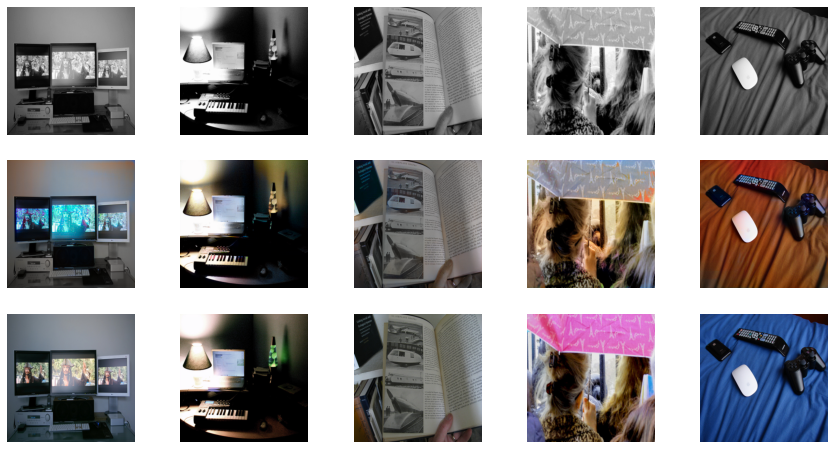

First row : grayscale image, Second row : colored image, Third row : real image


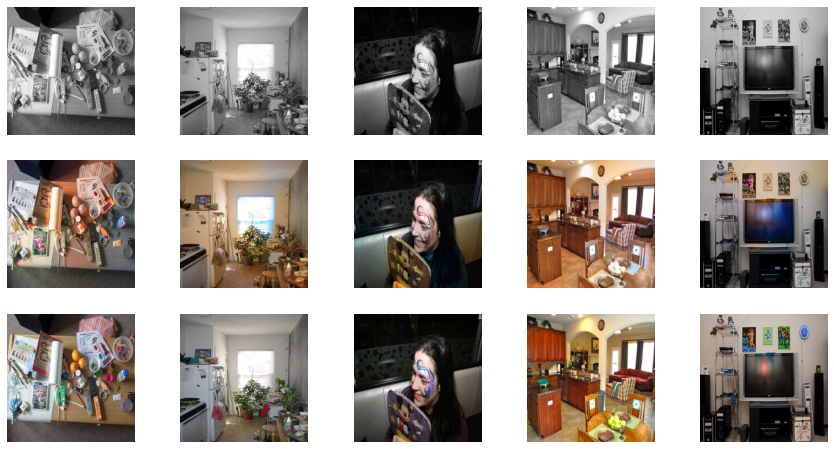

KeyboardInterrupt: ignored

In [ ]:
visualizeTestImages(generator, test_dataloader)

Mounted at /content/gdrive
Recovering weights and status


  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 1/100
Iteration 200/500
loss_D_fake: 0.59360
loss_D_real: 0.58776
loss_D: 0.59068
loss_G_GAN: 1.20072
loss_G_L1: 8.66204
loss_G: 9.86276


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


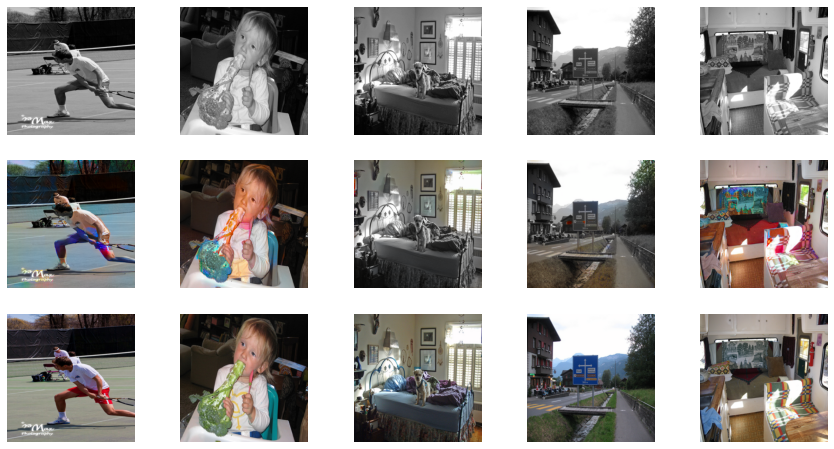


Epoch 1/100
Iteration 400/500
loss_D_fake: 0.58263
loss_D_real: 0.59219
loss_D: 0.58741
loss_G_GAN: 1.19661
loss_G_L1: 8.78041
loss_G: 9.97701


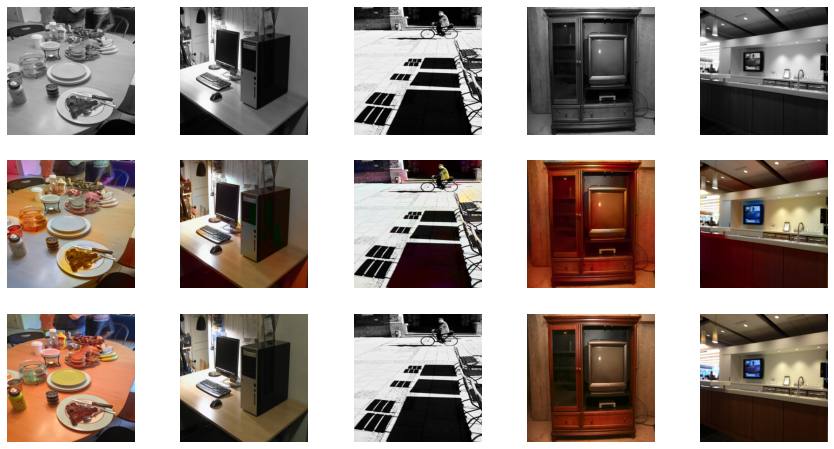

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 2/100
Iteration 200/500
loss_D_fake: 0.56856
loss_D_real: 0.58375
loss_D: 0.57616
loss_G_GAN: 1.12143
loss_G_L1: 8.13567
loss_G: 9.25710


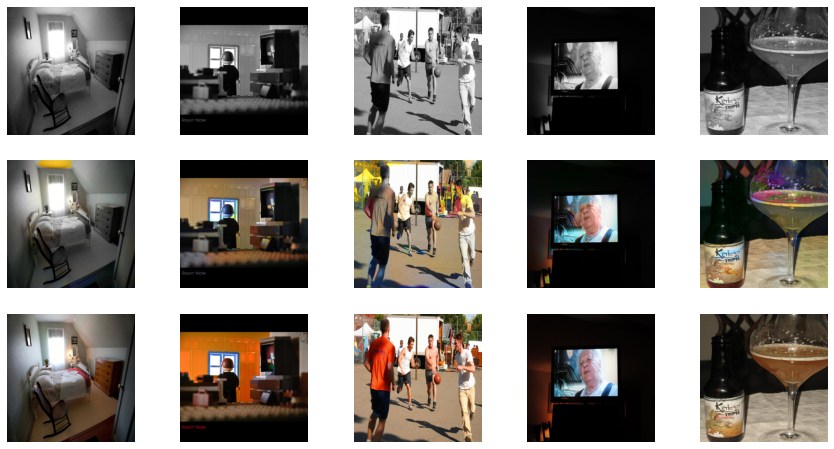


Epoch 2/100
Iteration 400/500
loss_D_fake: 0.57178
loss_D_real: 0.58270
loss_D: 0.57724
loss_G_GAN: 1.13023
loss_G_L1: 8.14186
loss_G: 9.27209


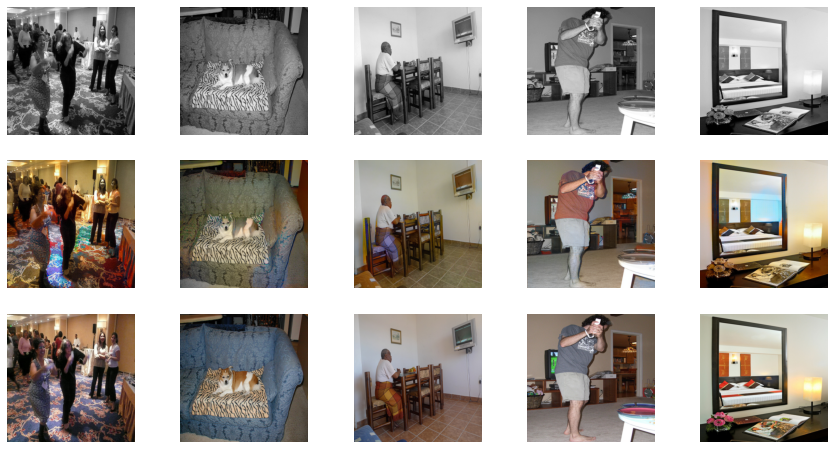

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 3/100
Iteration 200/500
loss_D_fake: 0.57915
loss_D_real: 0.59492
loss_D: 0.58704
loss_G_GAN: 1.09435
loss_G_L1: 7.66194
loss_G: 8.75628


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


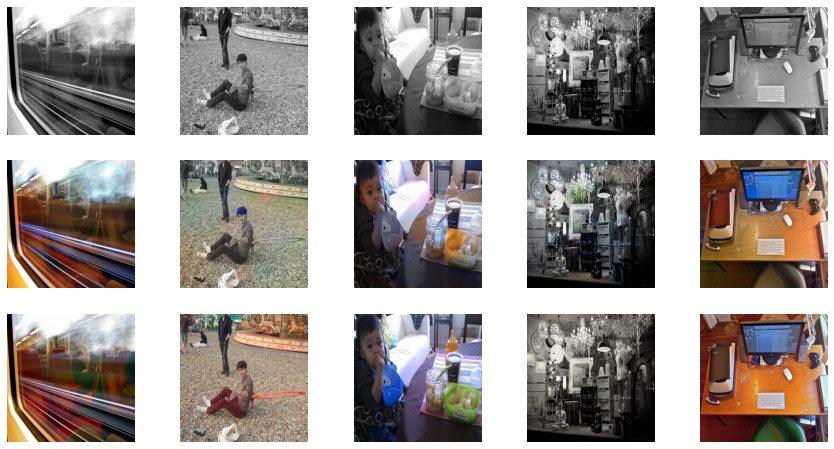


Epoch 3/100
Iteration 400/500
loss_D_fake: 0.57514
loss_D_real: 0.59010
loss_D: 0.58262
loss_G_GAN: 1.09364
loss_G_L1: 7.67941
loss_G: 8.77305


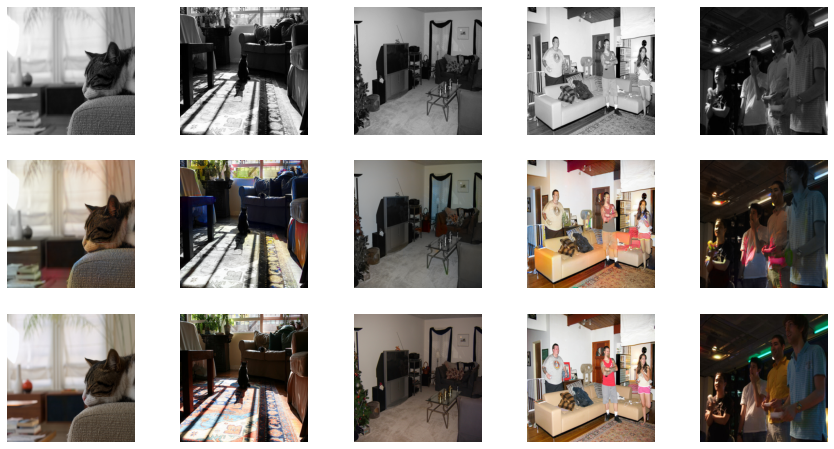

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 4/100
Iteration 200/500
loss_D_fake: 0.58081
loss_D_real: 0.59845
loss_D: 0.58963
loss_G_GAN: 1.07014
loss_G_L1: 7.20004
loss_G: 8.27019


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 43 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


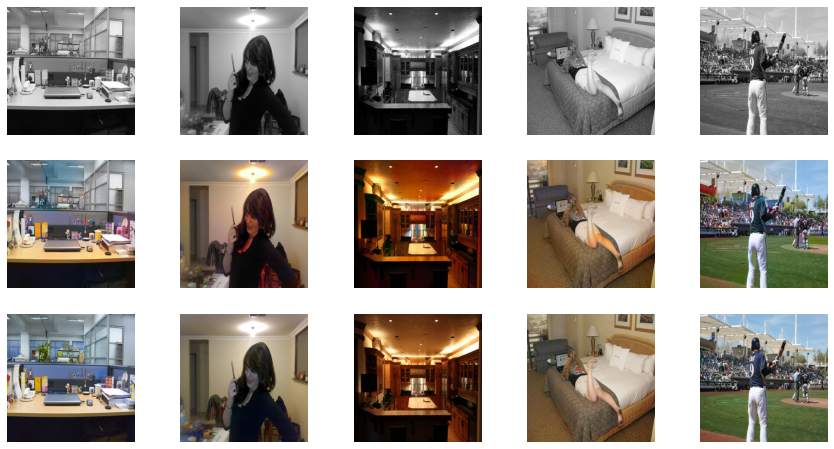


Epoch 4/100
Iteration 400/500
loss_D_fake: 0.58082
loss_D_real: 0.59471
loss_D: 0.58777
loss_G_GAN: 1.07709
loss_G_L1: 7.21187
loss_G: 8.28896


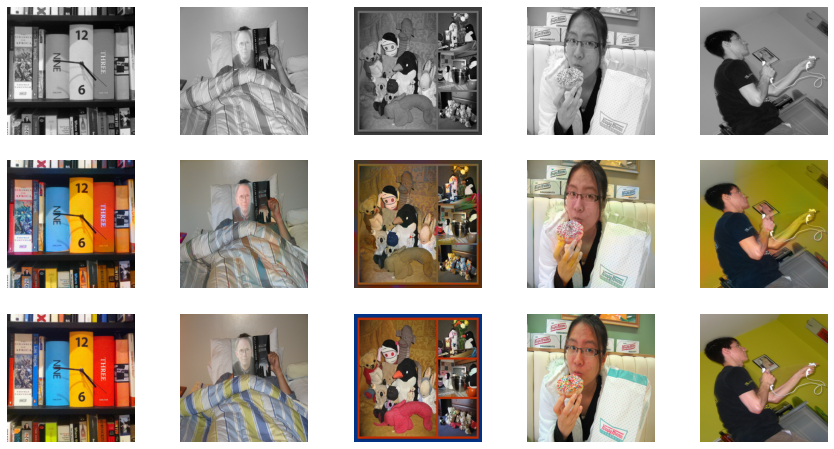

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 5/100
Iteration 200/500
loss_D_fake: 0.59852
loss_D_real: 0.60524
loss_D: 0.60188
loss_G_GAN: 1.06097
loss_G_L1: 6.72267
loss_G: 7.78364


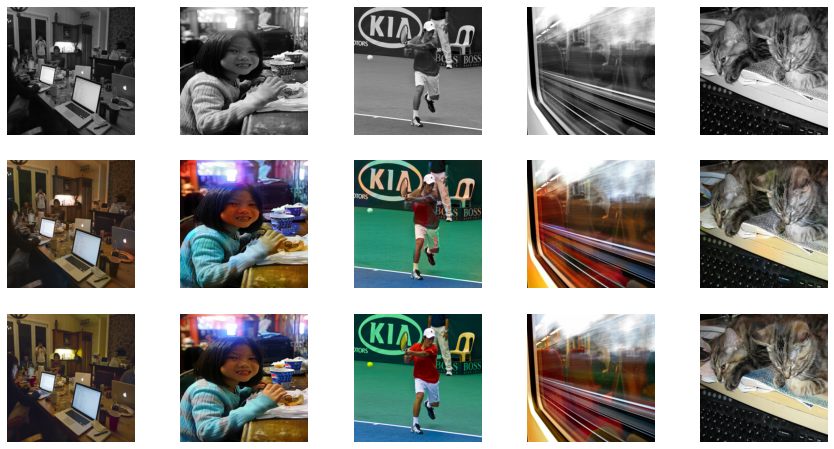


Epoch 5/100
Iteration 400/500
loss_D_fake: 0.59163
loss_D_real: 0.60414
loss_D: 0.59788
loss_G_GAN: 1.05627
loss_G_L1: 6.81372
loss_G: 7.86999


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


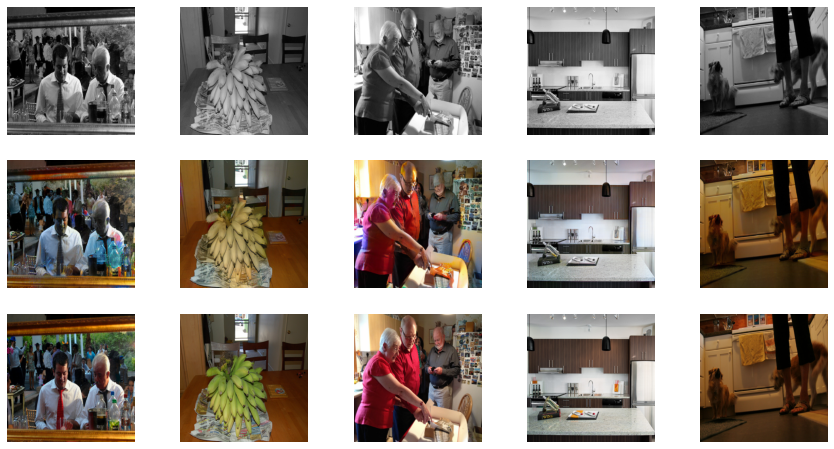

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 6/100
Iteration 200/500
loss_D_fake: 0.59119
loss_D_real: 0.59874
loss_D: 0.59496
loss_G_GAN: 1.03004
loss_G_L1: 6.49394
loss_G: 7.52398


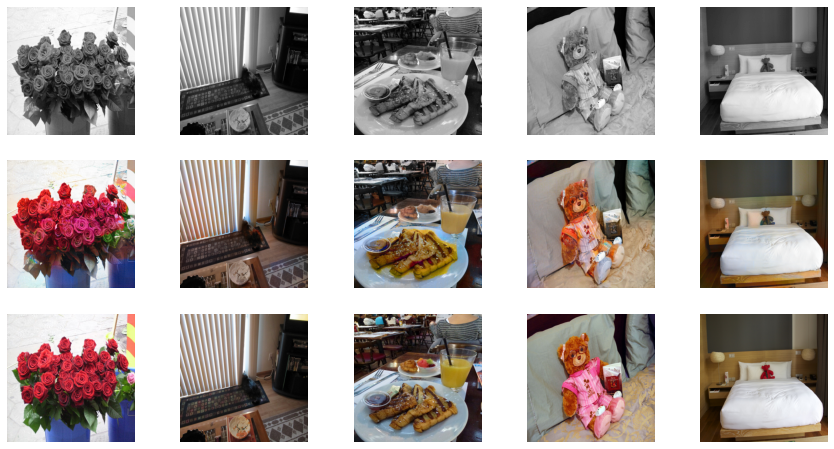


Epoch 6/100
Iteration 400/500
loss_D_fake: 0.59278
loss_D_real: 0.59880
loss_D: 0.59579
loss_G_GAN: 1.03920
loss_G_L1: 6.51300
loss_G: 7.55220


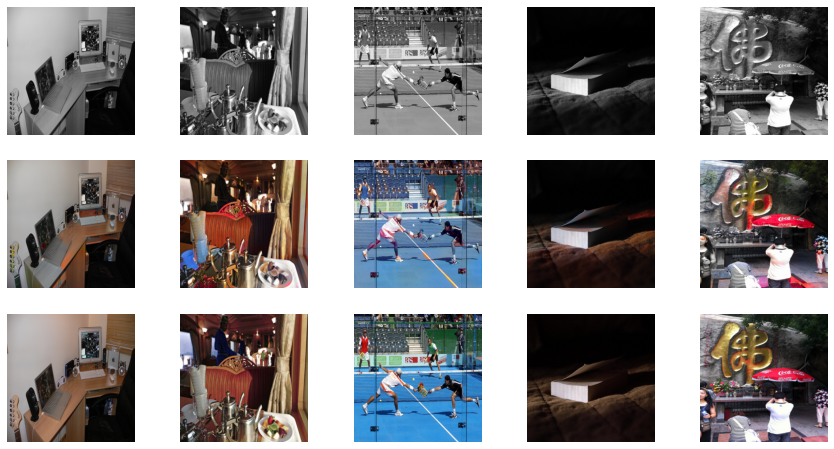

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 7/100
Iteration 200/500
loss_D_fake: 0.59882
loss_D_real: 0.60656
loss_D: 0.60269
loss_G_GAN: 1.03720
loss_G_L1: 6.29220
loss_G: 7.32939


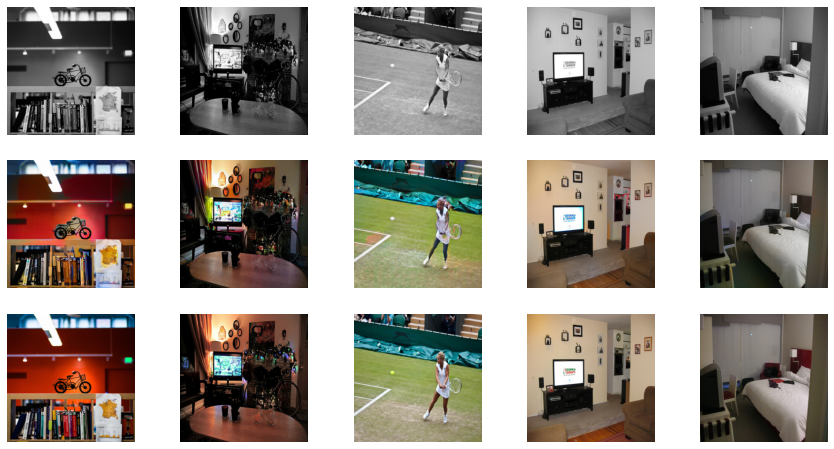


Epoch 7/100
Iteration 400/500
loss_D_fake: 0.59812
loss_D_real: 0.60590
loss_D: 0.60201
loss_G_GAN: 1.02918
loss_G_L1: 6.28318
loss_G: 7.31236


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 35 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


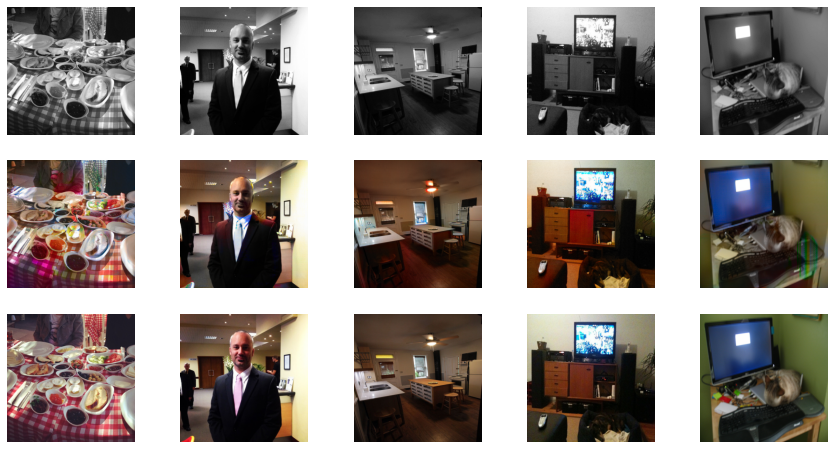

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 8/100
Iteration 200/500
loss_D_fake: 0.59968
loss_D_real: 0.60856
loss_D: 0.60412
loss_G_GAN: 1.01711
loss_G_L1: 5.99579
loss_G: 7.01291


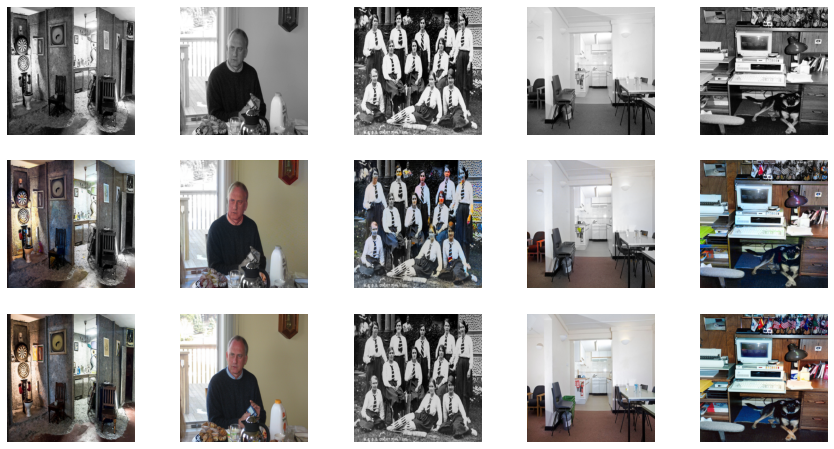


Epoch 8/100
Iteration 400/500
loss_D_fake: 0.59695
loss_D_real: 0.60994
loss_D: 0.60344
loss_G_GAN: 1.02559
loss_G_L1: 6.06711
loss_G: 7.09270


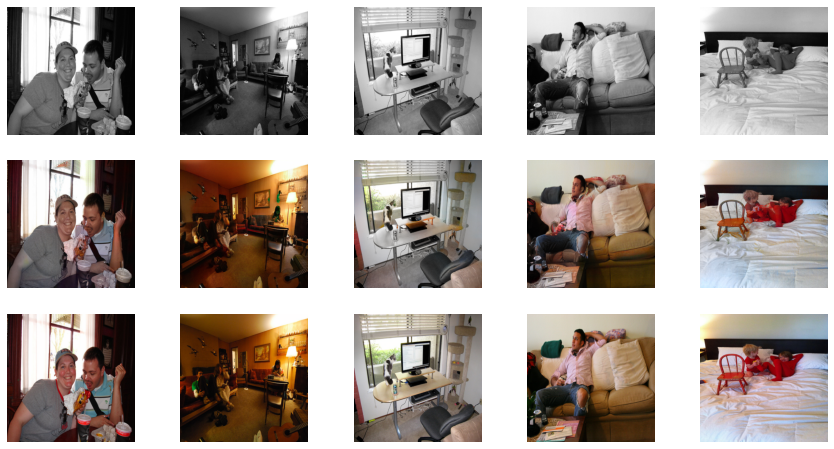

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 9/100
Iteration 200/500
loss_D_fake: 0.60241
loss_D_real: 0.61122
loss_D: 0.60681
loss_G_GAN: 1.01250
loss_G_L1: 5.83726
loss_G: 6.84977


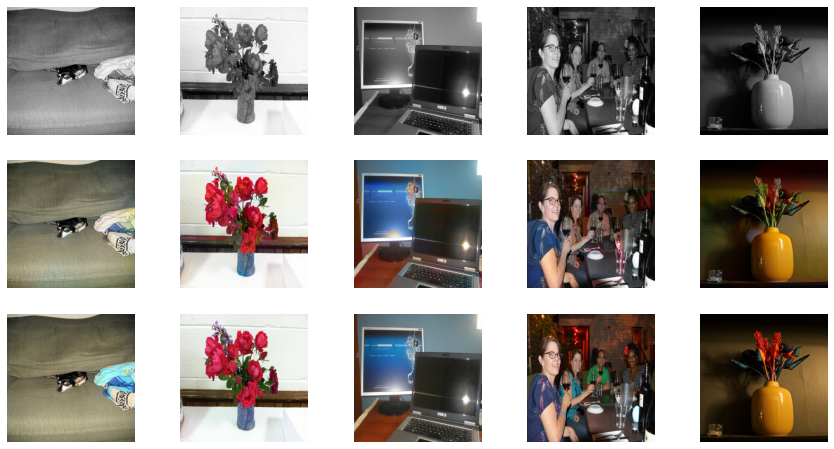


Epoch 9/100
Iteration 400/500
loss_D_fake: 0.60155
loss_D_real: 0.60989
loss_D: 0.60572
loss_G_GAN: 1.01592
loss_G_L1: 5.87070
loss_G: 6.88662


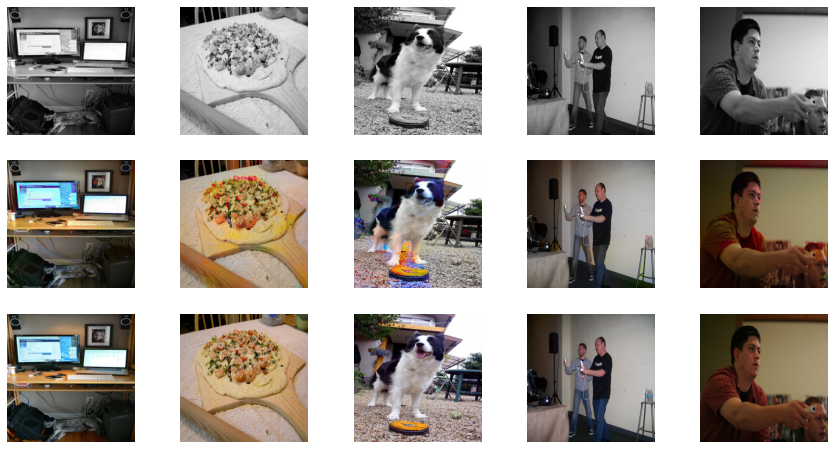

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 10/100
Iteration 200/500
loss_D_fake: 0.60893
loss_D_real: 0.61238
loss_D: 0.61065
loss_G_GAN: 1.00873
loss_G_L1: 5.70276
loss_G: 6.71149


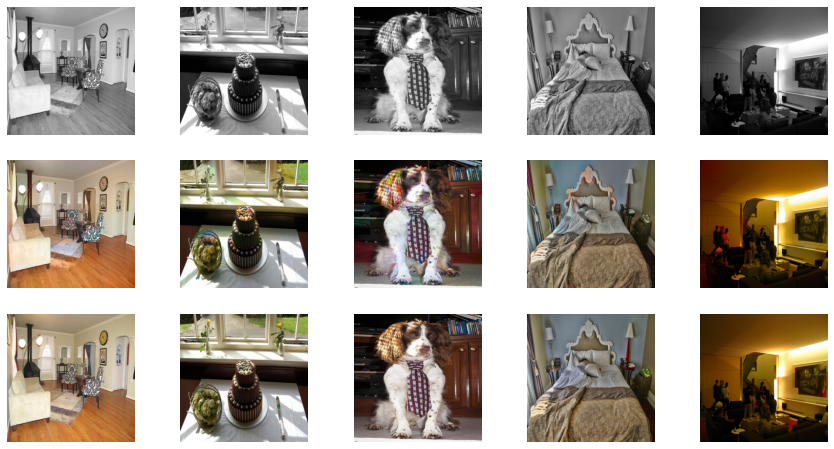


Epoch 10/100
Iteration 400/500
loss_D_fake: 0.60857
loss_D_real: 0.61496
loss_D: 0.61176
loss_G_GAN: 1.00624
loss_G_L1: 5.70826
loss_G: 6.71449


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 63 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


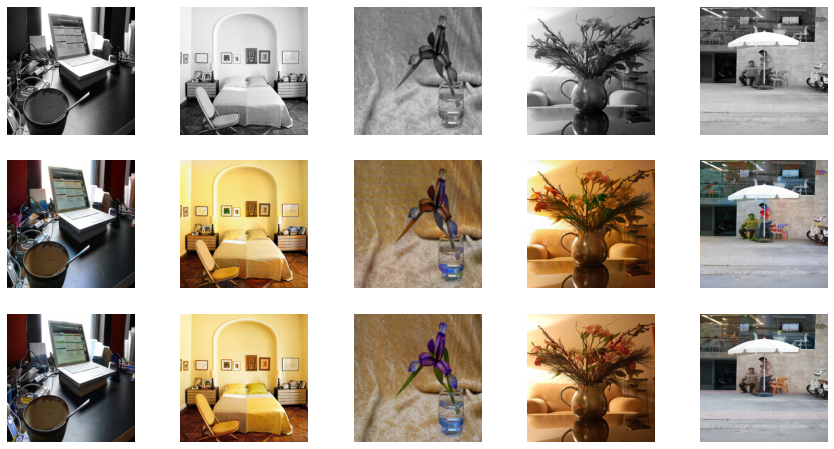

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 11/100
Iteration 200/500
loss_D_fake: 0.61019
loss_D_real: 0.61780
loss_D: 0.61399
loss_G_GAN: 1.00131
loss_G_L1: 5.51975
loss_G: 6.52106


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 7 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))
/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


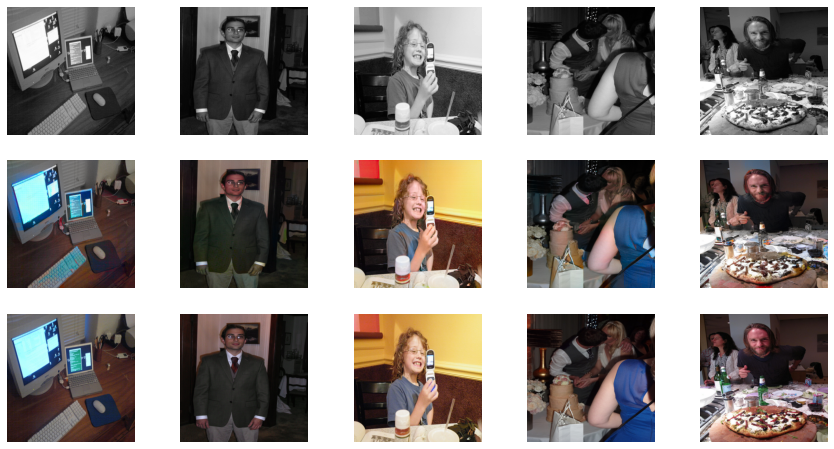


Epoch 11/100
Iteration 400/500
loss_D_fake: 0.62197
loss_D_real: 0.63005
loss_D: 0.62601
loss_G_GAN: 1.01190
loss_G_L1: 5.53941
loss_G: 6.55131


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 21 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


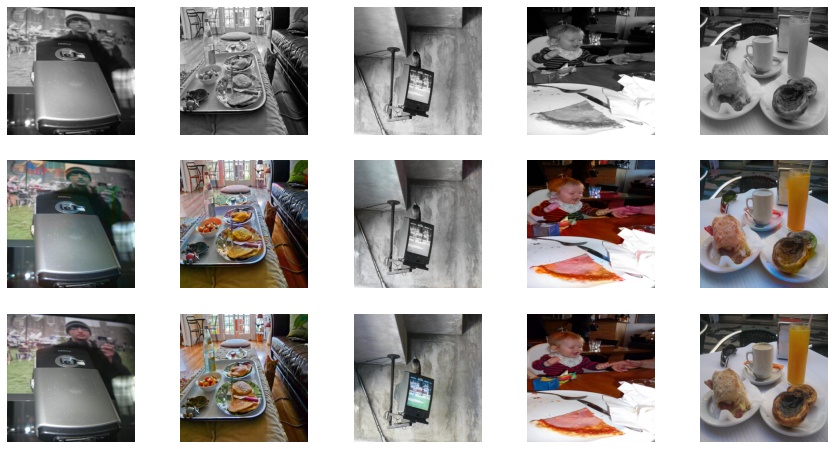

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 12/100
Iteration 200/500
loss_D_fake: 0.60624
loss_D_real: 0.60977
loss_D: 0.60801
loss_G_GAN: 0.97893
loss_G_L1: 5.37828
loss_G: 6.35721


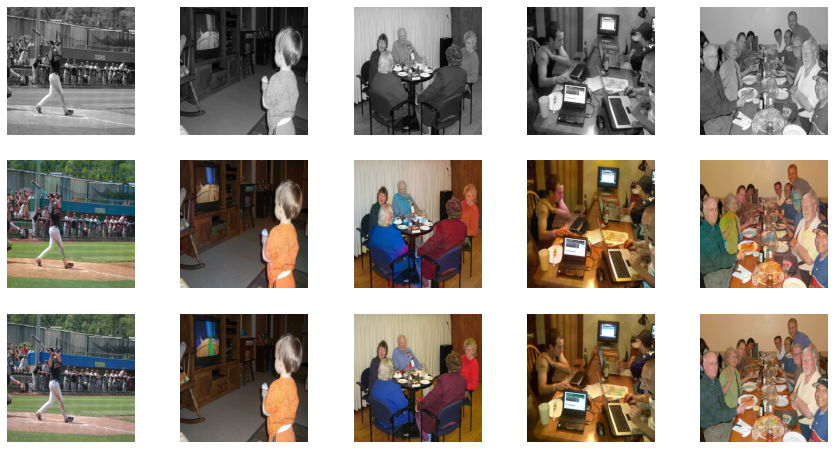


Epoch 12/100
Iteration 400/500
loss_D_fake: 0.60597
loss_D_real: 0.61550
loss_D: 0.61074
loss_G_GAN: 0.98440
loss_G_L1: 5.41264
loss_G: 6.39705


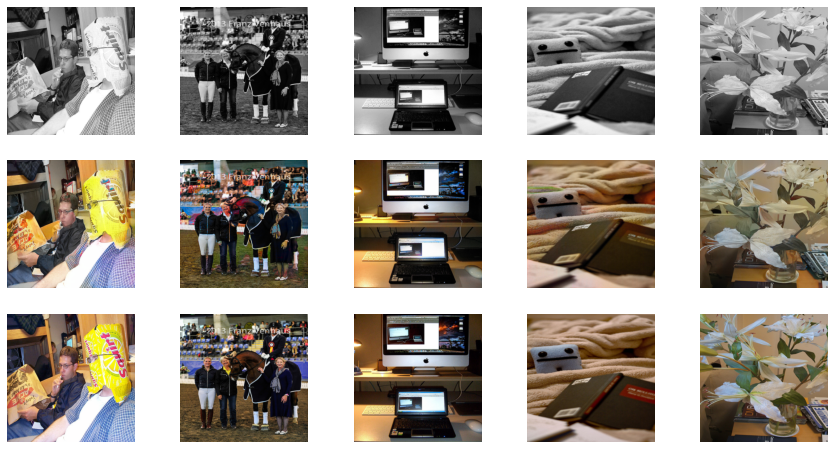

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 13/100
Iteration 200/500
loss_D_fake: 0.61178
loss_D_real: 0.61618
loss_D: 0.61398
loss_G_GAN: 0.97928
loss_G_L1: 5.30110
loss_G: 6.28038


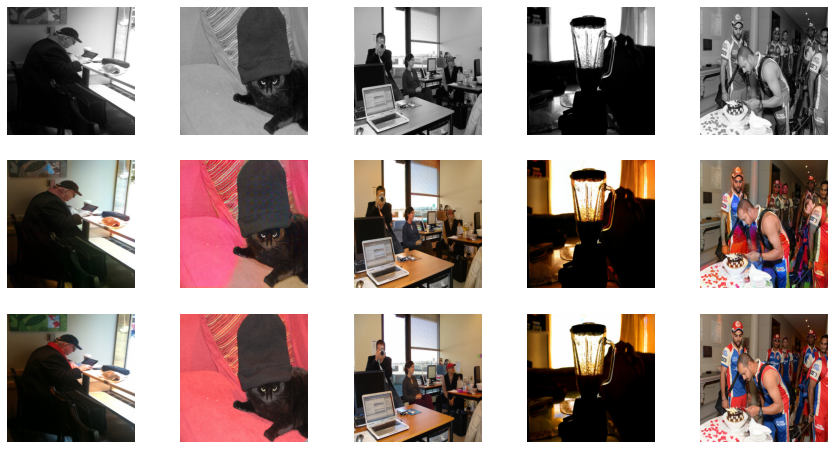


Epoch 13/100
Iteration 400/500
loss_D_fake: 0.61247
loss_D_real: 0.61575
loss_D: 0.61411
loss_G_GAN: 0.98234
loss_G_L1: 5.28559
loss_G: 6.26793


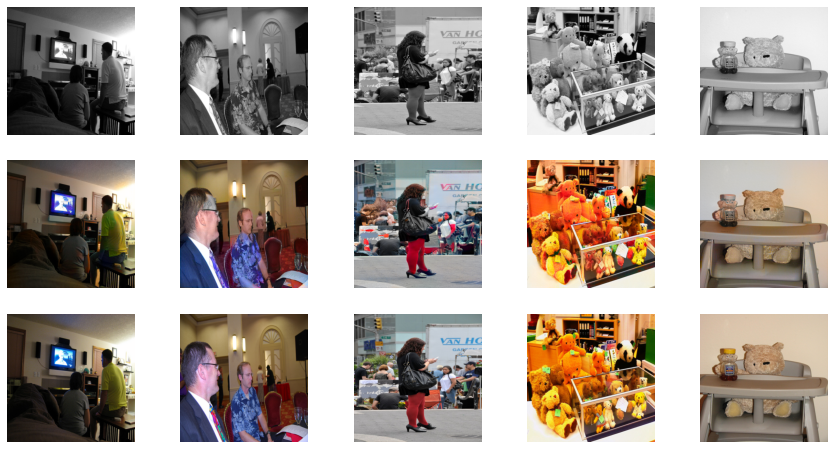

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 14/100
Iteration 200/500
loss_D_fake: 0.61148
loss_D_real: 0.62287
loss_D: 0.61717
loss_G_GAN: 0.97626
loss_G_L1: 5.20508
loss_G: 6.18134


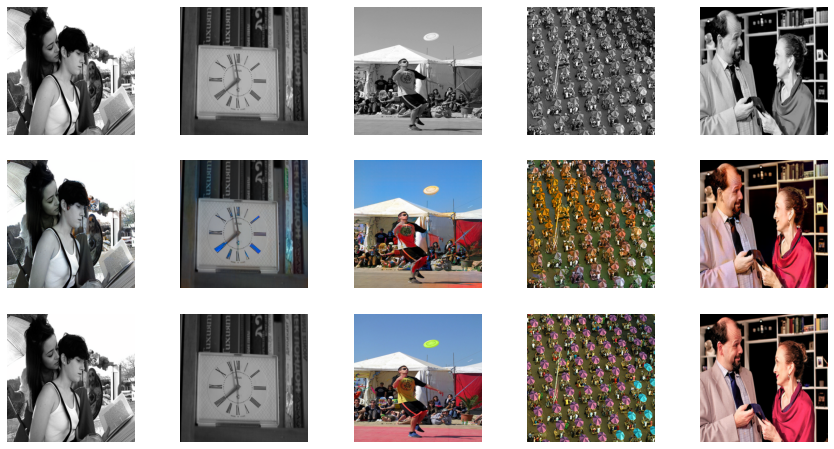


Epoch 14/100
Iteration 400/500
loss_D_fake: 0.60962
loss_D_real: 0.61686
loss_D: 0.61324
loss_G_GAN: 0.98306
loss_G_L1: 5.23257
loss_G: 6.21563


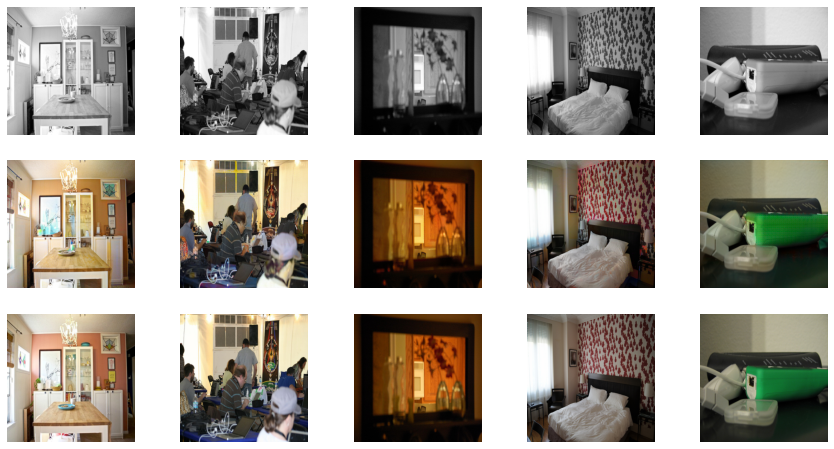

  0%|          | 0/500 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

path_g = "/content/gdrive/MyDrive/weights/generator.pt"
path_d = "/content/gdrive/MyDrive/weights/discriminator.pt"
path_go = "/content/gdrive/MyDrive/weights/generator_optimizer.pt"
path_do = "/content/gdrive/MyDrive/weights/discriminator_optimizer.pt"
path_losses = '/content/gdrive/MyDrive/weights/losses.txt'

net_G = build_res_unet(n_input=1, n_output=2, size=256)
#Solo per la prima volta: net_G.load_state_dict(torch.load(path_resnet, map_location="cuda"))
model = MainModel(net_G=net_G)
train_model(model, train_dataloader, 100, path_g, path_d, path_go, path_do, path_losses)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd gdrive/MyDrive/weights/resnet80/

In [ ]:
def plot_losses(path):
  losses_D = []
  losses_G = []
  epochs = []
  with open(path) as f:
    lines = [line for line in f]
    for ind in range(len(lines)):
      if (ind%8)==0:
        epoch = lines[ind].split(' ')[1]
        epochs.append(epoch)       
        losses_D.append(float(lines[ind+3].split(' ')[1].split('\n')[0]))
        losses_G.append(float(lines[ind+7].split(' ')[1].split('\n')[0]))
        
  ep = list(range(1, len(epochs)+1))
  plt.figure(figsize=(10,5))
  #plt.plot(epochs, losses_G, label="Generator loss")
  print(len(losses_D))
  plt.plot(ep, losses_D, 'b-', label="Discriminator loss")
  plt.figure(figsize=(10,5))
  plt.plot(ep, losses_G, 'r-', label="Discriminator loss")

  plt.figure(figsize=(10,5))
  plt.plot(ep, losses_D, 'b-', label="Discriminator loss")
  plt.plot(ep, losses_G, 'r-', label="Discriminator loss")

  plt.title('Model loss')
  plt.legend()
  plt.show()

In [ ]:
plot_losses('losses.txt')